In [1]:
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm, LinearSegmentedColormap, SymLogNorm
import pandas as pd
import numpy as np

import rasterio as rio
import shapely
import contextily as cx

import cartopy.crs as ccrs
import cartopy.feature as cfeature
from cartopy.io import img_tiles

from plotting import dynamic_plot, static_plot, plot_lisa_clusters
from processing import retrieve_ais, spatial_autocorrelation, lisa_clusters
import xarray as xr
import rioxarray

from libpysal.weights import lat2W
from esda.moran import Moran, Moran_Local

from scipy.ndimage import convolve

In [ ]:
#conda install -c conda-forge netcdf4

In [2]:
box = [-3075006, -3032747, 2876817, 2168395]

retrieve_ais(box, start_year=2011, stop_year=2020)

Requesting data for 2011:
Decoding RGB values to AIS Traffic
Min: 0.0009999999
Max: 2000.0002
Mean: 10.838154
NaN %: 99.71295067325762
2011 successfully downloaded.
Requesting data for 2012:
Decoding RGB values to AIS Traffic
Min: 0.0009999999
Max: 2000.0002
Mean: 2.4628186
NaN %: 96.58198743831315
2012 successfully downloaded.
Requesting data for 2013:
Decoding RGB values to AIS Traffic
Min: 0.0009999999
Max: 2000.0002
Mean: 3.6493328
NaN %: 95.96495736965389
2013 successfully downloaded.
Requesting data for 2014:
Decoding RGB values to AIS Traffic
Min: 0.0009999999
Max: 2000.0002
Mean: 3.6269395
NaN %: 95.43971783238541
2014 successfully downloaded.
Requesting data for 2015:
Decoding RGB values to AIS Traffic
Min: 0.0009999999
Max: 2000.0002
Mean: 3.0991428
NaN %: 93.77459592137988
2015 successfully downloaded.
Requesting data for 2016:
Decoding RGB values to AIS Traffic
Min: 0.0009999999
Max: 2000.0002
Mean: 3.5806863
NaN %: 95.04538842302865
2016 successfully downloaded.
Requesting

Given temporal AIS maritime traffic concentration data for September 2011-2020, we can create a Generalized Space-Time ARIMA-X model, with arctic ice concentration as an explanatory variable, to forecast and determine the effects of ice on shipping traffic location over time. GSTARIMA-X was chosen as an extension of classic time series and geospatial analysis as it accounts for spatial and temporal autocorrelation, which is expected for this kind of data. 

As part of this, we can also determine the spatial autocorrelation of AIS traffic and ice separately, and the temporal autocorrelation for both variables. A Mann-Kendall non-parametric test can be used to test for statistically significant monotonic trends over time, and geostatistical techniques like Moran's I and the Knox test can be used to evaluate spatial autocorrelation and changes in space. 

## Spatial Analysis

Primary Methods:
1. Spatial Autocorrelation (Moran's I)
2. Knox Test

### AIS Traffic

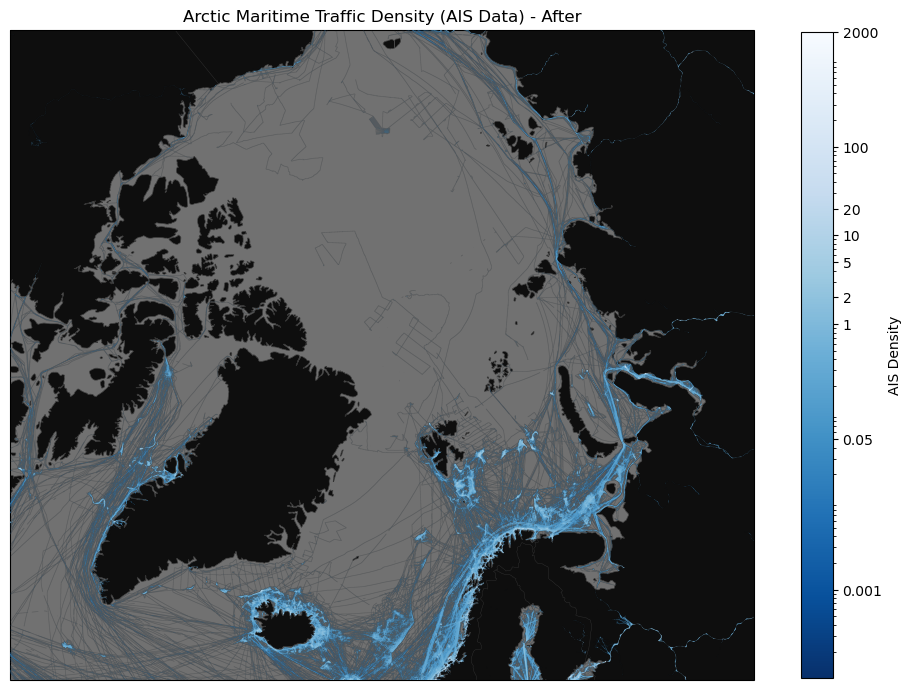

In [22]:
#Display shipping data
# blues = plt.get_cmap('Blues_r')
# colors = blues(np.linspace(0.2, 1, 256))
# cmap = LinearSegmentedColormap.from_list('Blues_r_trimmed', colors)

with rio.open('data/ais_traffic/arctic_maritime_2020.tif') as src:
    img_arr = src.read(1)
    bounds = src.bounds
    proj = ccrs.NorthPolarStereo(central_longitude=0, true_scale_latitude=71)
    extent = [bounds.left, bounds.right, bounds.bottom, bounds.top]
    fig, ax = plt.subplots(figsize=(12, 12), subplot_kw={'projection': proj})
    ax.set_xlim(bounds.left, bounds.right)
    ax.set_ylim(bounds.bottom, bounds.top)
    norm = LogNorm(vmin=0.0001, vmax=2000)
    
    ax.add_feature(cfeature.OCEAN.with_scale('50m'), facecolor="#717171", edgecolor='none', zorder=0)
    ax.add_feature(cfeature.LAND.with_scale('50m'), facecolor='#0e0e0e', edgecolor='none', zorder=1)
    ax.add_feature(cfeature.COASTLINE.with_scale('50m'), edgecolor='#333333', linewidth=0.5, zorder=2)
    ax.add_feature(cfeature.BORDERS.with_scale('50m'), edgecolor='#333333', linewidth=0.3, zorder=2)

    im = ax.imshow(img_arr, cmap='Blues_r', extent=extent, norm=norm, zorder=3)

    cbar_ticks = [0.001, 0.05, 1, 2, 5, 10, 20, 100, 2000]

    cbar = plt.colorbar(im, ax=ax, ticks=cbar_ticks, shrink=0.7)
    cbar.ax.set_yticklabels([str(i) for i in cbar_ticks])
    cbar.set_label('AIS Density')
    ax.set_title('Arctic Maritime Traffic Density (AIS Data) - After')
        
    plt.show()

In [3]:
from IPython.display import HTML

with rio.open('data/ais_traffic/arctic_maritime_2020.tif') as src:
    bounds = src.bounds

anim = dynamic_plot(years=[2011, 2012, 2013, 2014, 2015, 2016, 2017, 2018, 2019, 2020],
                    bounds=bounds,
                    interval=600,
                    shipping=True, ice=True, save=True)

plt.close(anim._fig)
HTML(anim.to_jshtml())

### Shipping Differenced Image

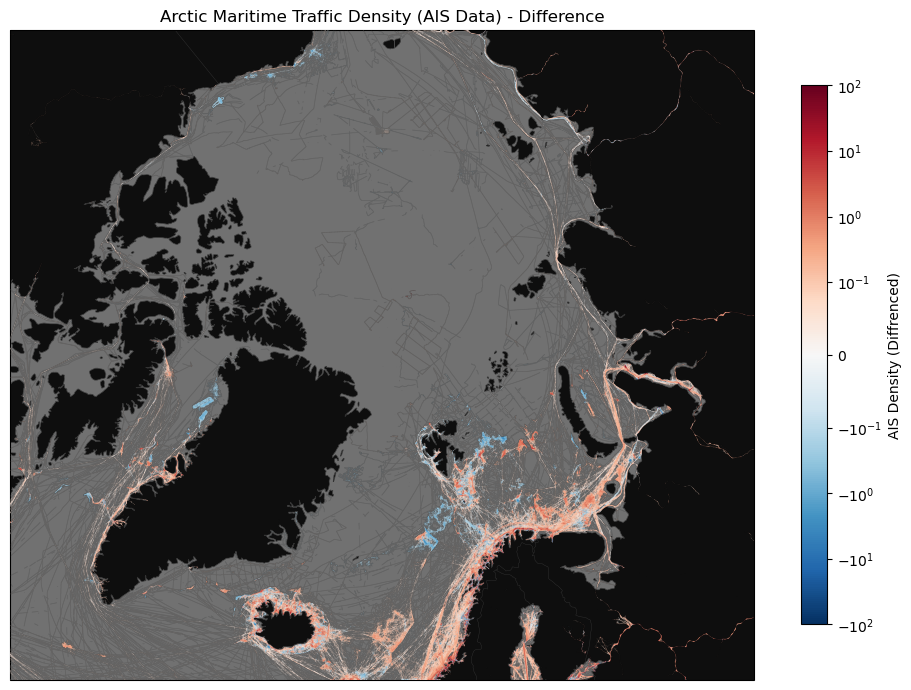

In [2]:
maritime = 'data/ais_traffic/arctic_maritime'
ice_con = 'data/ice_concentration/ice_conc_nh_ease2-250_cdr-v3p1_'

with rio.open(f'{maritime}_{2012}.tif') as src:
    bounds = src.bounds
    img_arr_mari_before = src.read(1)
    #img_arr_mari_before= np.nan_to_num(img_arr_mari_before, nan=0.0)


with rio.open(f'{maritime}_{2020}.tif') as src:
    img_arr_mari_after = src.read(1)
    #img_arr_mari_after= np.nan_to_num(img_arr_mari_after, nan=0.0)

proj = ccrs.NorthPolarStereo(central_longitude=0, true_scale_latitude=71)
extent = [bounds.left, bounds.right, bounds.bottom, bounds.top]
norm = LogNorm(vmin=0.0001, vmax=2000)

fig, ax = plt.subplots(figsize=(12, 10), subplot_kw={'projection': proj})
ax.set_xlim(bounds.left, bounds.right)
ax.set_ylim(bounds.bottom, bounds.top)


ax.add_feature(cfeature.OCEAN.with_scale('50m'), facecolor="#717171", edgecolor='none', zorder=0)
ax.add_feature(cfeature.LAND.with_scale('50m'), facecolor='#0e0e0e', edgecolor='none', zorder=1)
ax.add_feature(cfeature.COASTLINE.with_scale('50m'), edgecolor='#333333', linewidth=0.5, zorder=2)
ax.add_feature(cfeature.BORDERS.with_scale('50m'), edgecolor='#333333', linewidth=0.3, zorder=2)

both_nan_mask = np.isnan(img_arr_mari_before) & np.isnan(img_arr_mari_after)


before_filled = np.nan_to_num(img_arr_mari_before, nan=0.0)
after_filled = np.nan_to_num(img_arr_mari_after, nan=0.0)

img_arr_mari_diff = after_filled - before_filled

img_arr_mari_diff[both_nan_mask] = np.nan


norm_diff = SymLogNorm(linthresh=0.1, linscale=1, vmin=-100, vmax=100, base=10)

im_mari = ax.imshow(img_arr_mari_diff, cmap='RdBu_r', extent=extent, norm=norm_diff, zorder=4)

# cbar_ticks = [0.001, 0.05, 1, 2, 5, 10, 20, 100, 2000]

cbar = plt.colorbar(im_mari, ax=ax, shrink=0.7)
# cbar.ax.set_yticklabels([str(i) for i in cbar_ticks])
cbar.set_label('AIS Density (Diffrenced)')
ax.set_title('Arctic Maritime Traffic Density (AIS Data) - Difference')
    
plt.show()

### Spatial autocorrelation

In [8]:
def spatial_autocorrelation(raster):
    mask = ~np.isnan(raster)
    data = np.nan_to_num(raster, nan=0.0)

    means = data[mask].mean()
    std = data[mask].std()
    z = (data - means)/std

    z[~mask]=0

    kernel = np.array([[1, 1, 1],
                       [1, 0, 1],
                       [1, 1, 1]])

    #Spatial weights
    kernel = kernel/kernel.sum()

    #Calculate spatial lag
    spatial_lag = convolve(z, kernel, mode='constant', cval=0.0)

    #Use spatial lag to calculate local Moran's I
    local_morans = z * spatial_lag

    #Global I: 
    global_morans = np.sum(local_morans[mask])/np.sum(z[mask]**2)

    #mask local morans for NAs:
    local_morans = np.where(mask, local_morans, np.nan)
    
    return global_morans, local_morans

In [3]:
globl, local, p_vals, clusters = spatial_autocorrelation(img_arr_mari_diff)


In [4]:
p_vals[~np.isnan(p_vals)]

array([0.72437866, 0.72459606, 0.72416013, ..., 0.72479454, 0.72463778,
       0.72418559], shape=(2862777,))

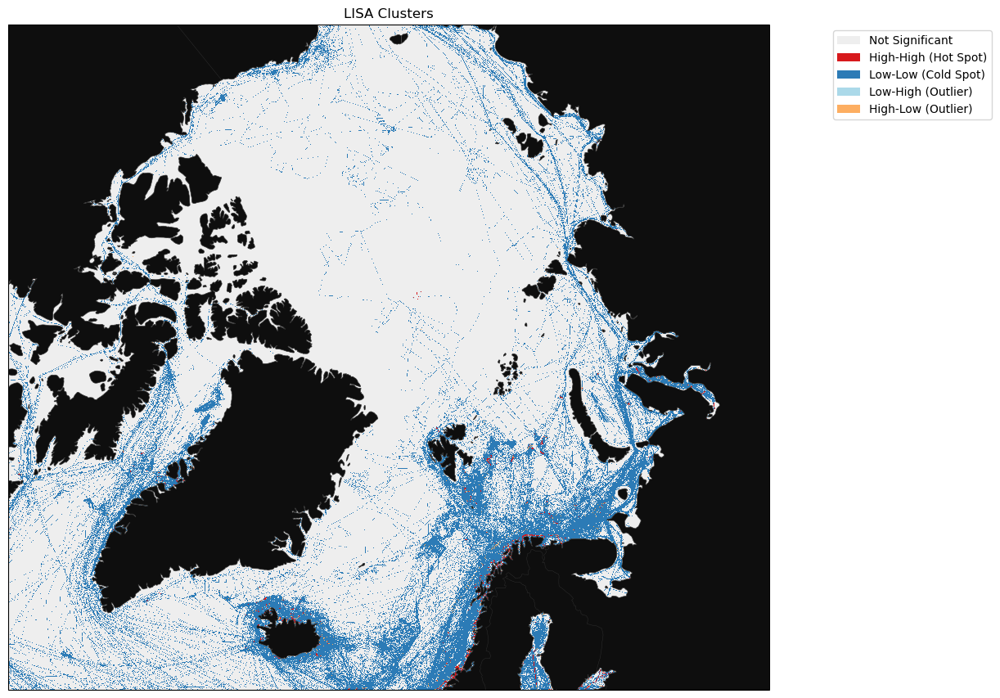

In [4]:
plot_lisa_clusters(clusters)

In [ ]:
proj = ccrs.NorthPolarStereo(central_longitude=0, true_scale_latitude=71)
extent = [bounds.left, bounds.right, bounds.bottom, bounds.top]
norm = LogNorm(vmin=0.0001, vmax=2000)

fig, ax = plt.subplots(figsize=(12, 10), subplot_kw={'projection': proj})
ax.set_xlim(bounds.left, bounds.right)
ax.set_ylim(bounds.bottom, bounds.top)


ax.add_feature(cfeature.OCEAN.with_scale('50m'), facecolor="#717171", edgecolor='none', zorder=0)
ax.add_feature(cfeature.LAND.with_scale('50m'), facecolor='#0e0e0e', edgecolor='none', zorder=1)
ax.add_feature(cfeature.COASTLINE.with_scale('50m'), edgecolor='#333333', linewidth=0.5, zorder=2)
ax.add_feature(cfeature.BORDERS.with_scale('50m'), edgecolor='#333333', linewidth=0.3, zorder=2)

norm_diff = SymLogNorm(linthresh=0.1, linscale=1, vmin=-100, vmax=100, base=10)

im_mari = ax.imshow(local, cmap='RdBu_r', extent=extent, zorder=4)

# cbar_ticks = [0.001, 0.05, 1, 2, 5, 10, 20, 100, 2000]

cbar = plt.colorbar(im_mari, ax=ax, shrink=0.7)
# cbar.ax.set_yticklabels([str(i) for i in cbar_ticks])
cbar.set_label('AIS Density (Diffrenced)')
ax.set_title('Arctic Maritime Traffic Density (AIS Data) - Difference')
    
plt.show()

In [4]:
flattened = img_arr_mari_diff.flatten()
valid_idx = np.where(~np.isnan(flattened))[0]

y_filtered = flattened[valid_idx]

rows, cols = img_arr_mari_diff.shape
w = lat2W(rows, cols, rook=False)
w_filtered = w.subset(valid_idx)

w_filtered.transform = 'r'

m_i = Moran(y_filtered, w_filtered)

print(f"Global Moran's I: {m_i.I}")
print(f"P-value: {m_i.p_sim}")

KeyboardInterrupt: 

In [ ]:
lisa = Moran_Local(flattened, w)
hotspot_map = lisa.Is.reshape(rows, cols)

### Ice Concentration Difference Image

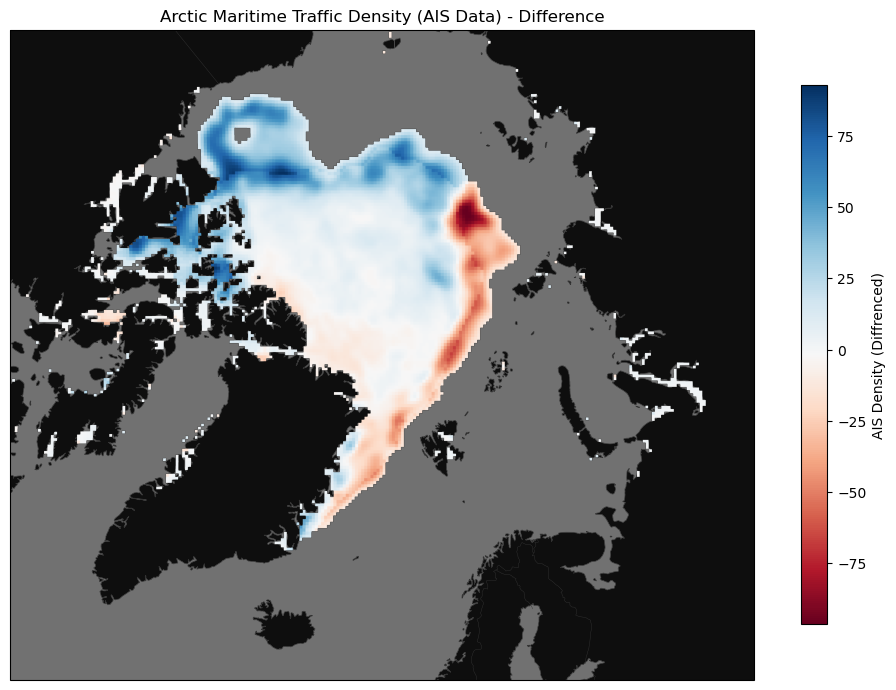

In [5]:
maritime = 'data/ais_traffic/arctic_maritime'
ice_con = 'data/ice_concentration/ice_conc_nh_ease2-250_cdr-v3p1_'

with rio.open(f'{maritime}_{2012}.tif') as src:
            ship_res = src.res 
ds = xr.open_dataset(f'{ice_con}{2012}09.nc')

temp = ds['ice_conc'].isel(time=0)
temp['xc'] = temp['xc'] * 1000
temp['yc'] = temp['yc'] * 1000
temp = temp.rio.set_spatial_dims(x_dim='xc', y_dim='yc')
temp.rio.write_crs('EPSG:6931', inplace=True)

temp_projected = temp.rio.reproject('EPSG:3995', resolution=ship_res)
temp_clipped = temp_projected.rio.clip_box(minx=bounds.left,
                                            miny=bounds.bottom,
                                            maxx=bounds.right,
                                            maxy=bounds.top)
img_arr_ice_before = temp_clipped.values.squeeze()
img_arr_ice_before = np.where(img_arr_ice_before <= 0, np.nan, img_arr_ice_before)

ds = xr.open_dataset(f'{ice_con}{2020}09.nc')

temp = ds['ice_conc'].isel(time=0)
temp['xc'] = temp['xc'] * 1000
temp['yc'] = temp['yc'] * 1000
temp = temp.rio.set_spatial_dims(x_dim='xc', y_dim='yc')
temp.rio.write_crs('EPSG:6931', inplace=True)

temp_projected = temp.rio.reproject('EPSG:3995', resolution=ship_res)
temp_clipped = temp_projected.rio.clip_box(minx=bounds.left,
                                            miny=bounds.bottom,
                                            maxx=bounds.right,
                                            maxy=bounds.top)
img_arr_ice_after = temp_clipped.values.squeeze()
img_arr_ice_after = np.where(img_arr_ice_after <= 0, np.nan, img_arr_ice_after)

proj = ccrs.NorthPolarStereo(central_longitude=0, true_scale_latitude=71)
extent = [bounds.left, bounds.right, bounds.bottom, bounds.top]
norm = LogNorm(vmin=0.0001, vmax=2000)

fig, ax = plt.subplots(figsize=(12, 10), subplot_kw={'projection': proj})
ax.set_xlim(bounds.left, bounds.right)
ax.set_ylim(bounds.bottom, bounds.top)


ax.add_feature(cfeature.OCEAN.with_scale('50m'), facecolor="#717171", edgecolor='none', zorder=0)
ax.add_feature(cfeature.LAND.with_scale('50m'), facecolor='#0e0e0e', edgecolor='none', zorder=1)
ax.add_feature(cfeature.COASTLINE.with_scale('50m'), edgecolor='#333333', linewidth=0.5, zorder=2)
ax.add_feature(cfeature.BORDERS.with_scale('50m'), edgecolor='#333333', linewidth=0.3, zorder=2)


both_nan_mask = np.isnan(img_arr_ice_before) & np.isnan(img_arr_ice_after)

before_filled = np.nan_to_num(img_arr_ice_before, nan=0.0)
after_filled = np.nan_to_num(img_arr_ice_after, nan=0.0)

img_arr_ice_diff = after_filled - before_filled

img_arr_ice_diff[both_nan_mask] = np.nan


# norm_diff = SymLogNorm(linthresh=0.1, linscale=1, vmin=-100, vmax=100, base=10)

im_ice = ax.imshow(img_arr_ice_diff, cmap='RdBu', extent=extent, zorder=4)

# cbar_ticks = [0.001, 0.05, 1, 2, 5, 10, 20, 100, 2000]

cbar = plt.colorbar(im_ice, ax=ax, shrink=0.7)
# cbar.ax.set_yticklabels([str(i) for i in cbar_ticks])
cbar.set_label('AIS Density (Diffrenced)')
ax.set_title('Arctic Maritime Traffic Density (AIS Data) - Difference')
    
plt.show()

In [6]:
globl, local, p_vals, clusters = spatial_autocorrelation(img_arr_ice_diff)

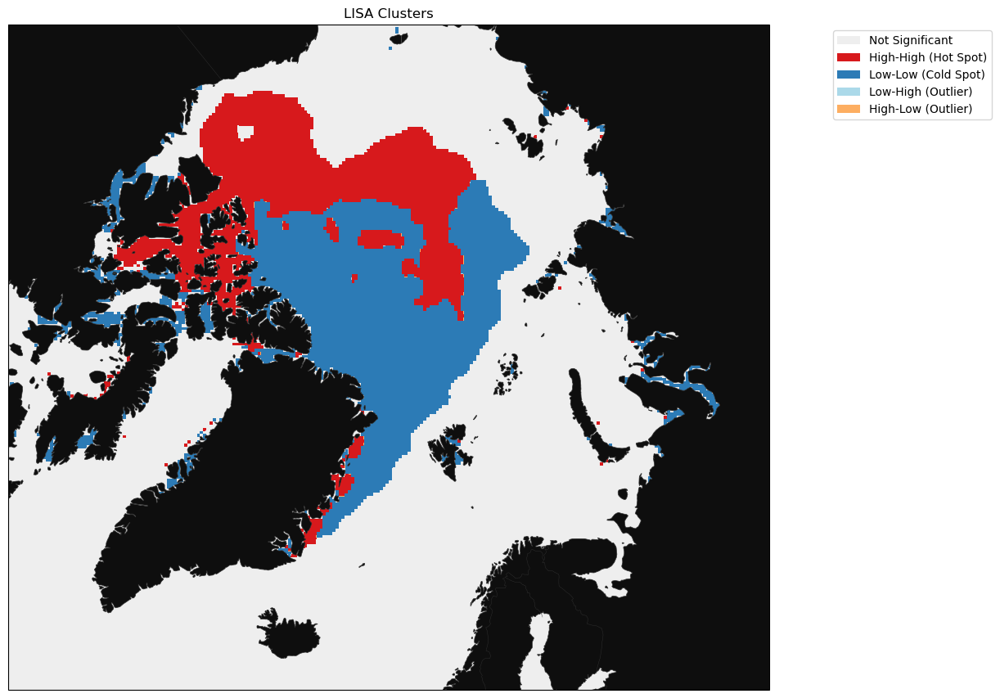

In [7]:
plot_lisa_clusters(clusters)

## Spatiotemporal analysis and modeling (for forecasting)

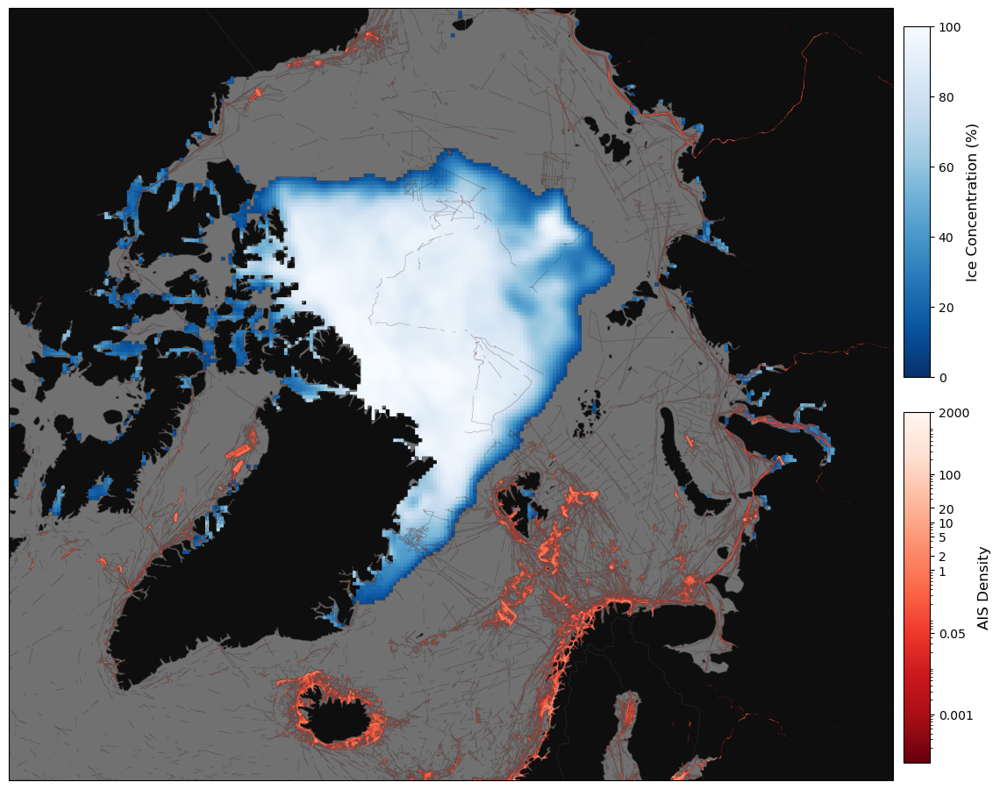

In [2]:
maritime = 'data/ais_traffic/arctic_maritime'
ice_con = 'data/ice_concentration/ice_conc_nh_ease2-250_cdr-v3p1_'

with rio.open(f'{maritime}_{2012}.tif') as src:
            ship_res = src.res 
            bounds = src.bounds
            img_arr_mari_before = src.read(1)
ds = xr.open_dataset(f'{ice_con}{2012}09.nc')

temp = ds['ice_conc'].isel(time=0)
temp['xc'] = temp['xc'] * 1000
temp['yc'] = temp['yc'] * 1000
temp = temp.rio.set_spatial_dims(x_dim='xc', y_dim='yc')
temp.rio.write_crs('EPSG:6931', inplace=True)

temp_projected = temp.rio.reproject('EPSG:3995', resolution=ship_res)
temp_clipped = temp_projected.rio.clip_box(minx=bounds.left,
                                            miny=bounds.bottom,
                                            maxx=bounds.right,
                                            maxy=bounds.top)
img_arr_ice_before = temp_clipped.values.squeeze()
img_arr_ice_before = np.where(img_arr_ice_before <= 0, np.nan, img_arr_ice_before)

fig, ax = static_plot(shipping_raster = img_arr_mari_before, shipping=True, ice_raster = img_arr_ice_before, ice=True)
plt.show()

## Sources

Spatio-Temporal Analysis: https://gdsl-ul.github.io/san/10-st_analysis.html
Statistical Inference for Trends in spatiotemporal data: https://www.sciencedirect.com/science/article/abs/pii/S0034425721003989
Columbia spatiotemporal analysis: https://www.publichealth.columbia.edu/research/population-health-methods/spatiotemporal-analysis


## Data Sources